# Ranking Ventral Activity of Odorant CSVs

A notebook for ranking the ventral activity of odorant stimuli given by data in CSV files.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

%matplotlib inline

A list of available CSV image files is loaded.

In [2]:
p = Path('.')
all_csvs = list(p.glob('csvs/*.csv'))

The average activity value across all image files is calculated.

In [3]:
data = []

for file in all_csvs:
    df = pd.read_csv(file, index_col=None, header=0)
    file_avg = df.mean(axis='columns').mean(axis='index')
    data.append(file_avg)

avg = np.mean(data)
print(avg)

-0.02022643180380698


For each CSV image file, the average activity of each row is calculated and the difference between these values and the previously calculated average across all images is stored. For all values in the middle of the image (index range 20:60), the sum is multiplied by a value of +10. For all values in the top and bottom of the image (index ranges 0:20 and 60:79), the sum is multiplied by a value of -10. These values together determine the ventrality value.

In [4]:
ventrality_data = []

im_df = pd.read_csv('imaging.csv')
id_df = pd.read_csv('identifiers.csv')

for file in all_csvs:
    stimulus = im_df.loc[im_df['File'] == str(file)]['Stimulus']
    concentration = id_df.loc[stimulus.index]['Conditions']
    df = pd.read_csv(file, index_col=None, header=0)
    
    mid_avg = df[20:60].mean(axis='columns').mean(axis='index')
    top_avgs = df[0:20]
    bttm_avgs = df[60:79]
    outer_avg = pd.concat([top_avgs, bttm_avgs]).mean(axis='columns').mean(axis='index')
    
    mid_val = (mid_avg - avg) * 10
    outer_val = (outer_avg - avg) * -10
    ventrality = mid_val + outer_val
    ventrality_data.append({'Stimulus': stimulus.item(), 'Concentration': concentration.item(), 'Ventrality': ventrality})

A DataFrame is created from the previously constructed list and sorted by highest ventrality level to lowest.

In [5]:
rankings = pd.DataFrame(ventrality_data, columns=['Stimulus', 'Concentration', 'Ventrality'])
ranked_df = rankings.sort_values(by='Ventrality', ascending=False)
ranked_df.to_csv('ventrality.csv', index=False)

Below is an additional visual representation of the table and the ranked images as a sanity check. 

In [6]:
print(ranked_df)

                     Stimulus Concentration  Ventrality
406  methyl trans-2-octenoate           NaN    8.343475
272                   nonanal           NaN    8.220548
166          methyl octanoate           NaN    8.042794
252                2-decanone           1/8    6.954552
283                   decanal        25 ppm    6.931615
..                        ...           ...         ...
158                eucalyptol           1/8   -9.998838
415         methyl salicylate       2.8 ppm  -10.090431
26       4-tert-butylpyridine           NaN  -10.215395
288      2,3-dimethylpyrazine           NaN  -10.221003
130                eucalyptol           1/8  -11.964446

[432 rows x 3 columns]


The DataFrame is then split into multiple lists for easier plotting and visualization.

In [7]:
ranked_stimuli = ranked_df['Stimulus'].values
ranked_split = [ranked_stimuli[x:x+54] for x in range(0, len(ranked_stimuli), 54)]

The list is then iterated through and plotted below.

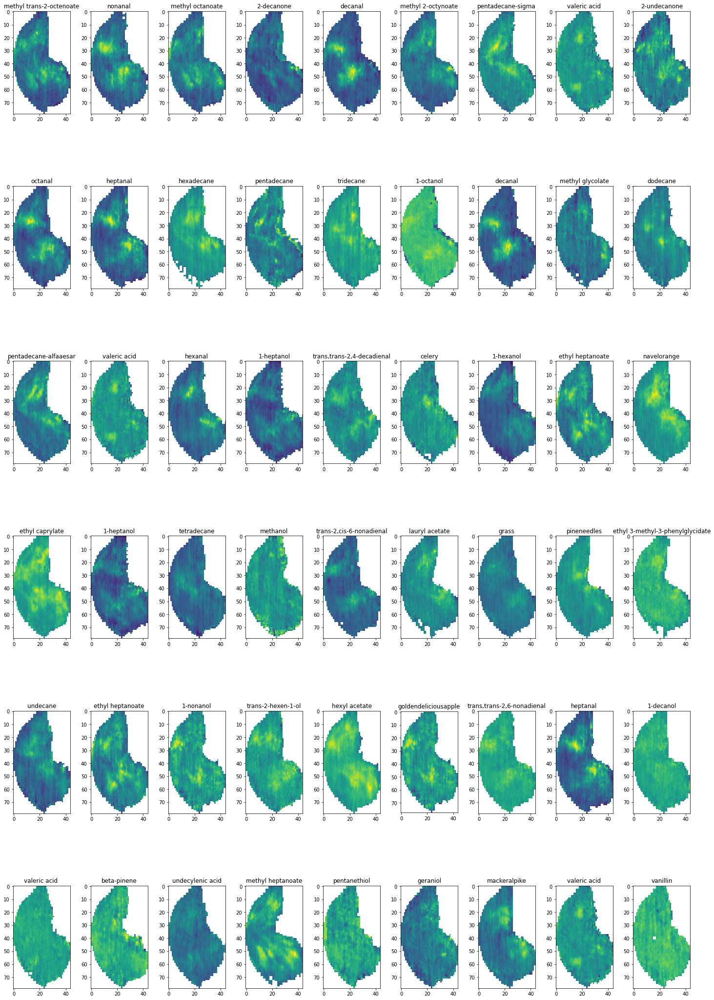

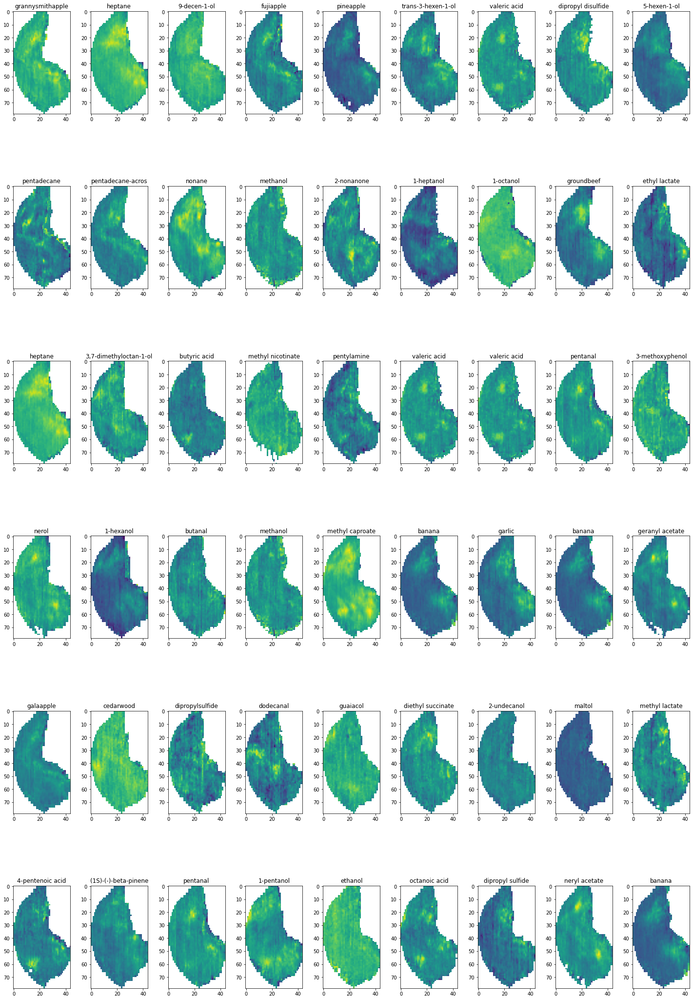

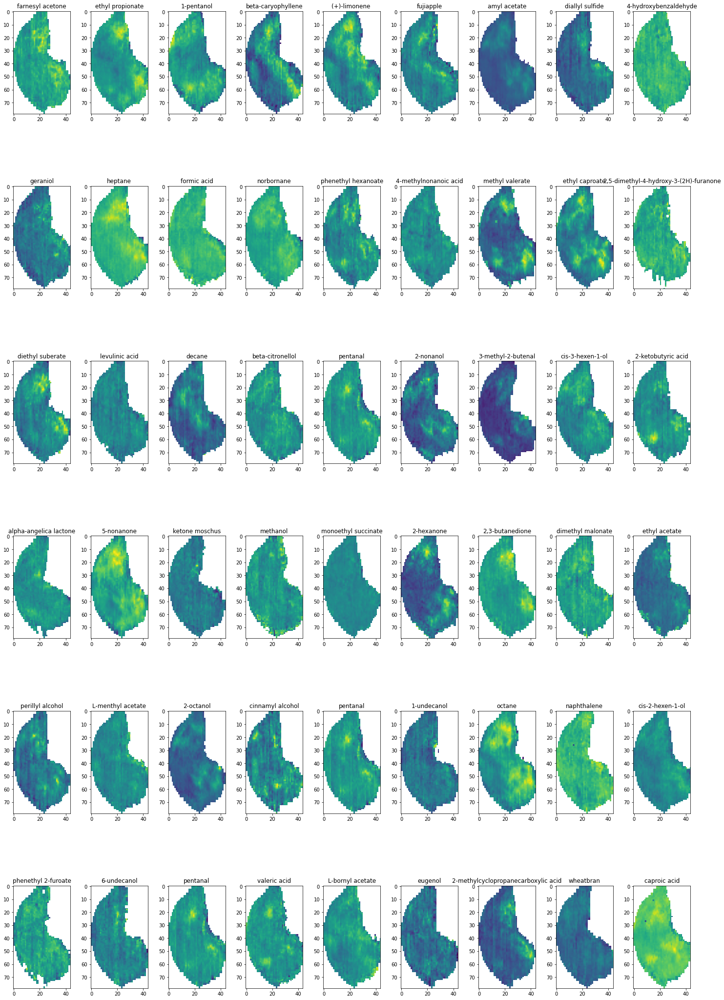

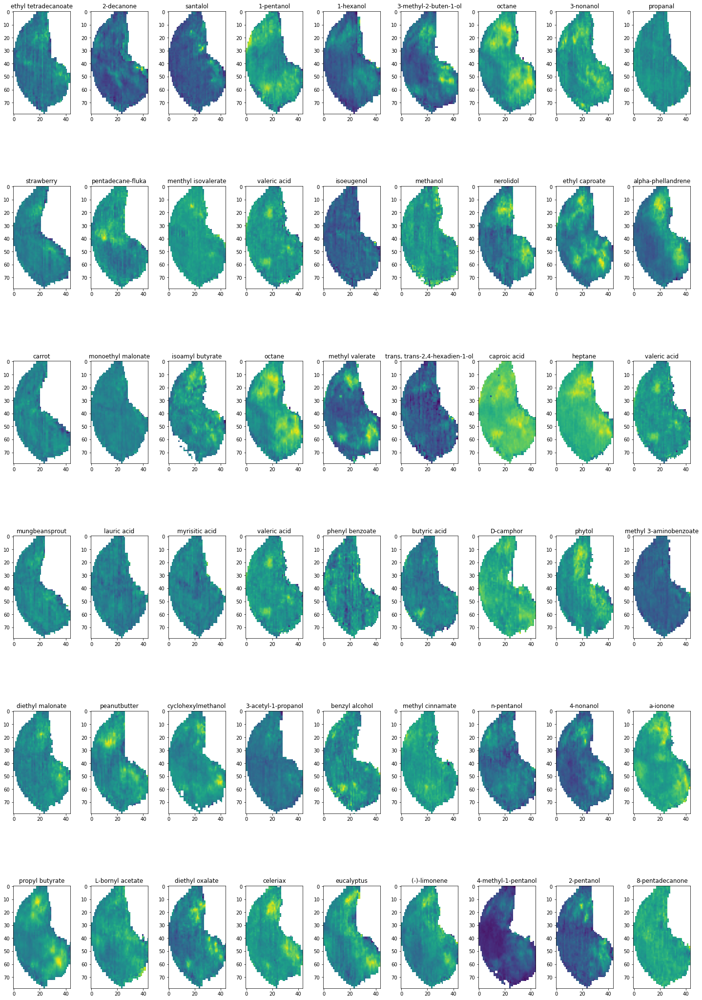

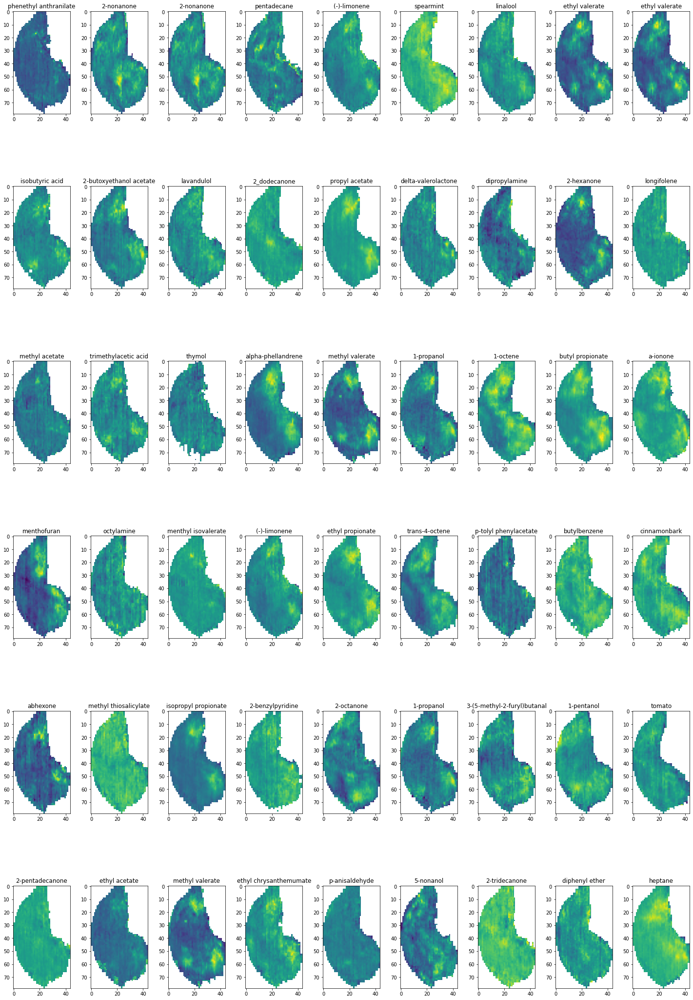

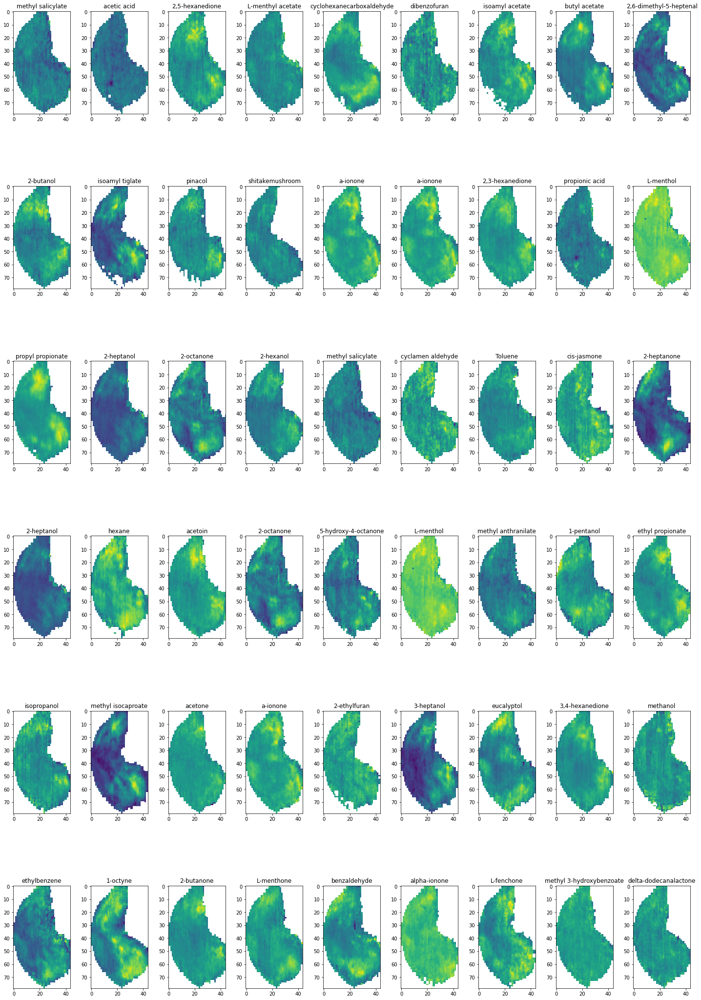

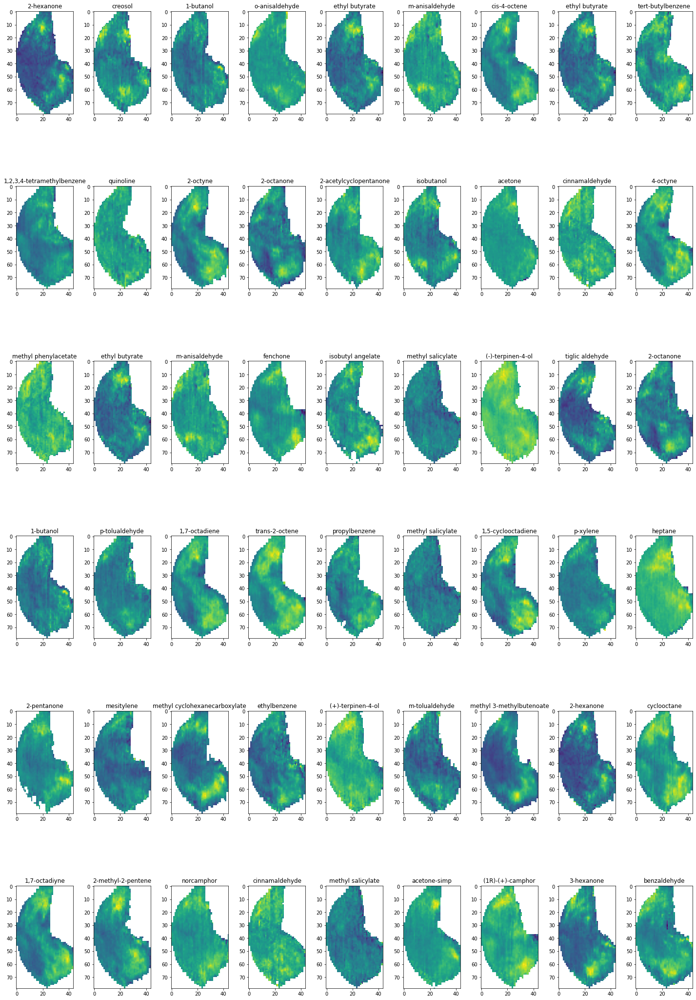

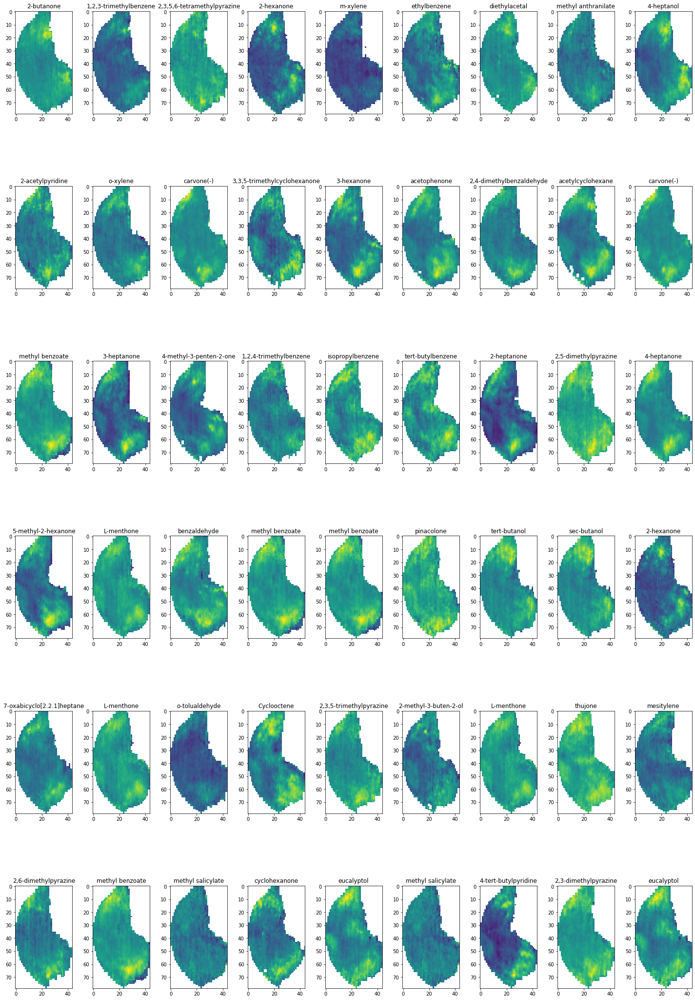

In [8]:
for stimuli in ranked_split:
    fig, ax = plt.subplots(6, 9, figsize=(20,30))
    fig.tight_layout()
    ax = ax.ravel()
    
    for ax_id, stimulus in enumerate(stimuli):
        images = im_df.loc[im_df['Stimulus'] == stimulus]['File']
        for file in images:
            df = pd.read_csv(file, index_col=None, header=0)
            ax[ax_id].set_title(stimulus)
            ax[ax_id].imshow(df)